# 1 My network summary

## Network source

Data is extracted using VK API from VK.com – one of the biggest Russian Social Network

This is my friends network. My profile is https://vk.com/anyamb . I'm an active person and have lots of friends from different events, school, conferences, sport trips.

## Preprocessing

Firstly, there is an import of libraries for network downloading and the creation of a social network graph. 

In [1]:
import vk_api
import tqdm
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy
from IPython.display import SVG

import warnings
warnings.filterwarnings('ignore')

from __future__ import division

import scipy.spatial as spt
from collections import Counter

import matplotlib.image as mpimg

Let's use VK API and download required information.

This is the authorization in VK.

In [2]:
my_email = 'email'
my_pswd = 'pass'

vk_session = vk_api.VkApi(my_email, my_pswd)
vk_session.auth()

vk = vk_session.get_api()

Command vk.friends.get()["items"] derives all friends id list of the current logged in user (me). There is an example of first 5 ids (in ascending order) and the total number of my friends.

In [3]:
friend_ids = vk.friends.get()["items"]
print 'First 5 ids (in ascending order) of my friends: {}'.format(friend_ids[:5])  
print 'The total number of my friends: {}'.format(len(friend_ids))

First 5 ids (in ascending order) of my friends: [36330, 137362, 155584, 251232, 451851]
The total number of my friends: 427


Next step is to download friends lists of my friends.

In [4]:
graph = {}
deleted_friend_ids = []

for friend_id in tqdm.tqdm(friend_ids):
    try:
        graph[friend_id] = vk.friends.get(user_id = friend_id)["items"]
    except:
        deleted_friend_ids.append(friend_id)

100%|██████████| 427/427 [02:46<00:00,  2.62it/s]


In [5]:
print 'Ids of people who was blocked by VK or who deleted his/her accounts : {}'.format(deleted_friend_ids)
print ' '
print 'The total number of people deleted from VK of were blocked by it: {}'.format(len(deleted_friend_ids))

Ids of people who was blocked by VK or who deleted his/her accounts : [600995, 3162770, 4535660, 5084890, 7921528, 15713742, 16930379, 19325188, 40465664, 63717102, 85659169, 89755979, 117969909, 122696391, 124769470, 149622775, 153543360, 155718997, 173852584, 193757664, 200347385, 362069179, 469235741]
 
The total number of people deleted from VK of were blocked by it: 23


Creation of the social network graph of my friends: adding nodes for my friends (only valid ones, i.e. not blocked, deleted) and edges if they know each other.

As the friendship can't be in one direction, I chose undirected graph.

In [6]:
G = nx.Graph(directed=False)
for i in graph:
    G.add_node(i)
    for j in graph[i]:
        if i != j and i in friend_ids and j in friend_ids \
        and i not in deleted_friend_ids and j not in deleted_friend_ids:
            G.add_edge(i, j)

### Adding attributes

Receiving the info about my friends: their first_name, last_name, gender, city, education, relationship status and some personal features.

Field 'personal' in VK includes various parameters: political views, languages, religion, inspired_by, people_main – improtant in others, life_main – personal priority, smoking – views on smoking, alcohol – views on alcohol. I decided to use only those coded as positive numbers, not strings, as this information is structured.

In [7]:
G_nodes = G.node.keys()

friend_ids_str = ', '.join([str(friend_id) for friend_id in G_nodes])

info = vk.users.get(user_ids = friend_ids_str, \
                    fields = 'first_name, last_name, sex, city, education, personal, relation', \
                    lang = 'en')

As for main fields: 
* Sex is coded as 1 — female; 2 — male; 0 — not specified;
* City returns user's city id and its name;
* Education is the information about user's higher education institution. I will use university ids they are short and convenient to work with;
* Relationship status such as: 1 – single; 2 – in a relationship; 3 – engaged; 4 – married: 5 – it's complicated; 6 – actively searching; 7 – in love.

0 in most cases means 'not specified'

In [8]:
sex = {1 : "female", 2 : "male", 0 : "not specified"}
relation = {1 : "single", 2 : "in a relationship", 3 : "engaged", 4 : "married", 
            5 : "it's complicated", 6 : "actively searching", 7 : "in love", 0 : "not specified"}

Personal features characteristics are below:

In [9]:
political = {1 : "Communist", 2 : "Socialist", 3 : "Moderate", 4 : "Liberal", 5 : "Conservative", 
             6 : "Monarchist", 7 : "Ultraconservative", 8 : "Apathetic", 9 : "Libertian", 0 : "not specified"}
people_main = {1 : "intellect and creativity", 2 : "kindness and honesty", 3 : "health and beauty",
               4 : "wealth and power", 5 : "courage and persistance", 6 : "humor and love for life", 
               0 : "not specified"}
life_main = {1 : "family and children", 2 : "career and money", 3 : "entertainment and leisure",
             4 : "science and research", 5 : "improving the world", 6 : "personal development",
             7 : "beauty and art", 8 : "fame and influence", 0 : "not specified"}
smoking = {1 : "very negative", 2 : "negative", 3 : "neutral", 
           4 : "compromisable", 5 : "positive", 0 : "not specified"} 
alchohol = {1 : "very negative", 2 : "negative", 3 : "neutral", 
            4 : "compromisable", 5 : "positive", 0 : "not specified"} 

### Example of attributes recieved

In [10]:
example = info[1]
print 'Main fields:'
print ' '
print 'First name:', example[u'first_name']
print 'Last name:', example[u'last_name']
print 'City:', example[u'city'][u'title']
print 'Gender:', example[u'sex'], sex[example[u'sex']]
print 'Relationship status:', example[u'relation'], relation[example[u'relation']]
print 'University id:', example[u'university'], '; University name:', example[u'university_name']

Main fields:
 
First name: Roman
Last name: Faynshmidt
City: Moscow
Gender: 2 male
Relationship status: 2 in a relationship
University id: 128 ; University name: НИУ ВШЭ (ГУ-ВШЭ)


In [11]:
print 'Personal features if specified:'
print ' '
print 'Relation to alcohol:', example[u'personal'][u'alcohol'], alchohol[example[u'personal'][u'alcohol']]
print 'Relation to smoking:', example[u'personal'][u'smoking'], smoking[example[u'personal'][u'smoking']]
print 'Improtant in others:', example[u'personal'][u'people_main'], people_main[example[u'personal'][u'people_main']]
print 'Personal priority:', example[u'personal'][u'smoking'], life_main[example[u'personal'][u'smoking']]
print 'Political views:', example[u'personal'][u'political'], political[example[u'personal'][u'political']]

Personal features if specified:
 
Relation to alcohol: 2 negative
Relation to smoking: 1 very negative
Improtant in others: 2 kindness and honesty
Personal priority: 1 family and children
Political views: 8 Apathetic


### Setting attributes into the network

In [12]:
## set attributes to nodes
id_list = [user[u'id'] for user in info]

# name
member_name = [user[u'first_name'] + ' ' + user[u'last_name'] for user in info]
member_name = dict(zip(id_list, member_name))
nx.set_node_attributes(G, 'name', member_name)

# gender
member_gender = [user[u'sex'] for user in info]
member_gender = dict(zip(id_list, member_gender))
nx.set_node_attributes(G, 'gender', member_gender)

# city title
member_city = [user[u'city'][u'title'] if 'city' in user else '-' for user in info]
member_city = dict(zip(id_list, member_city))
nx.set_node_attributes(G, 'city', member_city)

# university id
member_university = [user['university'] if 'university' in user else 0 for user in info]
member_university = dict(zip(id_list, member_university))
nx.set_node_attributes(G, 'university', member_university)

# university id
member_relation = [user['relation'] if 'relation' in user else 0 for user in info]
member_relation = dict(zip(id_list, member_relation))
nx.set_node_attributes(G, 'relation', member_relation)

# number of friends (popularity)
member_friends_count = {key:len(val) for key, val in graph.items()}
nx.set_node_attributes(G, 'friends', member_friends_count)

Also I added the number of friends this friend has as a measure of popularity.

In [13]:
personal_features_list = ["political", "smoking", "alcohol", "people_main", "life_main"]

for personal_feature in personal_features_list:
    feature = [user[u'personal'][personal_feature] \
                if ('personal' in user and personal_feature in user[u'personal']) \
                else 0 \
                for user in info]
    feature = dict(zip(id_list, feature))
    nx.set_node_attributes(G, personal_feature, feature)

In [14]:
nodes_df = pd.DataFrame(data = G.node).T
nodes_df.head(5)

,alcohol,city,friends,gender,life_main,name,people_main,political,relation,smoking,university
36330,0,Moscow,2982,2,0,Andrey Alyasov,0,6,0,0,236
137362,0,Moscow,387,1,0,Darya Ivanova,0,0,0,0,0
155584,2,Moscow,764,2,1,Maxim Markin,0,0,0,2,128
251232,0,Moscow,613,2,0,Dmitry Popov,0,0,0,0,240
451851,4,Saint Petersburg,782,1,5,Asya Kruglova,2,4,0,2,1902


In [15]:
node_appributes = ['gender', 'city', 'university', 'relation', 'friends']
all_node_attributes = list(np.append(node_appributes, personal_features_list))

for attrib in all_node_attributes:
    if attrib == 'friends':
        continue
    print "------ attribute:", attrib, "------" 
    print nodes_df[attrib].value_counts()
    print '------------------------------------'

------ attribute: gender ------
1    222
2    182
Name: gender, dtype: int64
------------------------------------
------ attribute: city ------
Moscow                           253
-                                 69
Berezniki                         17
Perm                              14
Saint Petersburg                  12
Yaroslavl                          4
Yekaterinburg                      4
Dolgoprudny                        3
Berlin                             2
London                             2
San Ġwann                          1
Minsk                              1
Obninsk                            1
Zhukovsky                          1
Strasbourg                         1
Podolsk                            1
Arkhangelsk                        1
Zelenograd                         1
Rostov-on-Don                      1
Kazan                              1
Austin                             1
Krasnodar                          1
Balashikha                         1
Mytis

There are plenty of missings in personal characteristics and relationship statuses. Therefore, these attributes are likely to be omitted later.

### Save the network

In [16]:
nx.write_gml(G, "my_network.gml")

### Download the network

In [17]:
G_full = nx.read_gml('my_network.gml')

### Size, Order

In [18]:
print("My network consists of {} friends with {} connections between each other."\
      .format(G_full.number_of_nodes(), G_full.number_of_edges()))
print('Number of connected components = {}'.format(nx.number_connected_components(G_full)))

My network consists of 399 friends with 3790 connections between each other.
Number of connected components = 14


In [19]:
nodes_df = pd.DataFrame(data = G_full.node).T
nodes_df.head(5)

,alcohol,city,friends,gender,id,label,life_main,name,people_main,political,relation,smoking,university
0,0,Moscow,646,2,0,13572109,0,Dmitry Menshenin,0,0,0,0,250
1,2,Moscow,1495,2,1,54622222,5,Roman Faynshmidt,2,8,2,1,128
2,0,Moscow,253,1,2,205223952,6,Darya Rykova,2,0,0,0,128
3,0,Moscow,454,2,3,13801489,0,Alexey Chernov,2,4,1,0,2
4,0,Moscow,173,1,4,17930258,0,Katya Anderson,0,0,0,0,128


### Gorgeous network layout

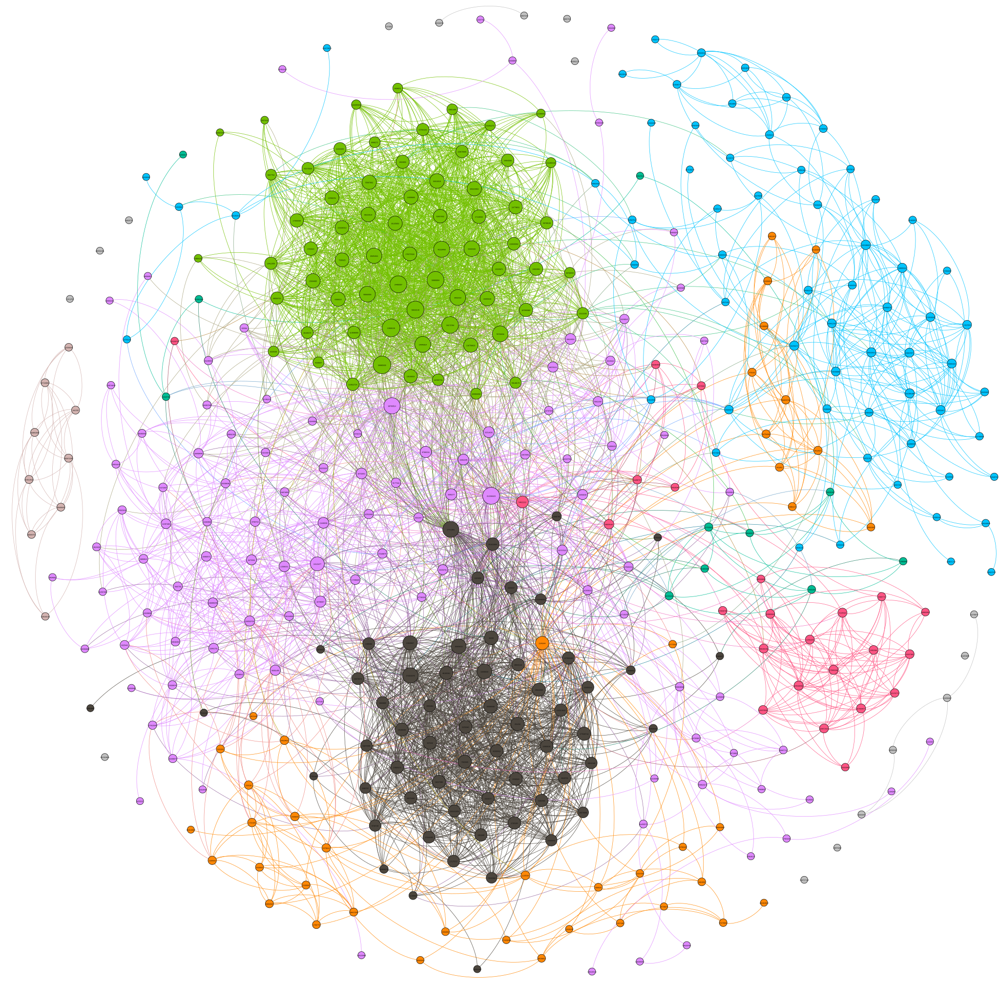

In [20]:
SVG(filename="com_by_degree.svg")

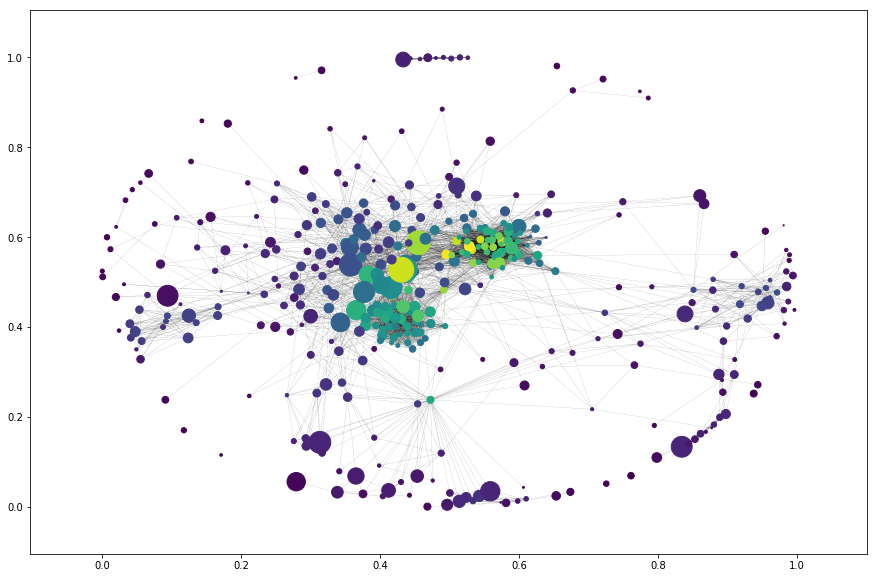

In [22]:
# size is how many friends this node has (the larger node the more friends)
# color - nodes degree (the lower the darker)

H = G_full
k = nx.degree(H)

plt.figure(figsize=(15,10))
nx.draw_networkx(H, 
                 node_size = [val["friends"]/8 for key, val in H.node.items()], 
                 node_color= k.values(),                 
                 with_labels=False, 
                 width=0.07)

In [23]:
CC = sorted(list(nx.connected_components(G_full)), key=len, reverse=True)

This is how many connected components in my social graph and how many eadges in each.

In [24]:
for i, component in enumerate(CC):
    print 'Component: {}; number of nodes: {}'.format(i+1, len(component))

Component: 1; number of nodes: 374
Component: 2; number of nodes: 9
Component: 3; number of nodes: 4
Component: 4; number of nodes: 2
Component: 5; number of nodes: 1
Component: 6; number of nodes: 1
Component: 7; number of nodes: 1
Component: 8; number of nodes: 1
Component: 9; number of nodes: 1
Component: 10; number of nodes: 1
Component: 11; number of nodes: 1
Component: 12; number of nodes: 1
Component: 13; number of nodes: 1
Component: 14; number of nodes: 1


In [25]:
G = G_full.subgraph(CC[0])

The only first component

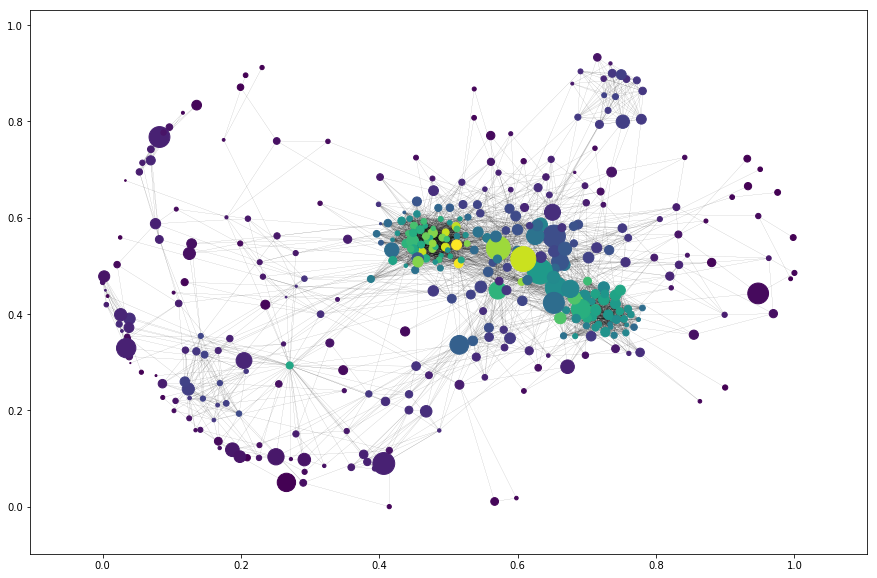

In [26]:
# size is how many friends this node has (the larger node the more friends)
# color - nodes degree (the lower the darker)

H = G
k = nx.degree(H)

plt.figure(figsize=(15,10))
nx.draw_networkx(H, 
                 node_size = [val["friends"]/8 for key, val in H.node.items()], 
                 node_color= k.values(),                 
                 with_labels=False, 
                 width=0.07)

### - Degree distribution, Diameter, Clustering Coefficient

In [27]:
degrees = G.degree().values()
n_nodes = len(degrees)
degrees_dist = pd.value_counts(degrees)
degrees_dist.sort_index(inplace = True)
pdf = degrees_dist/n_nodes
cdf = np.cumsum(pdf)

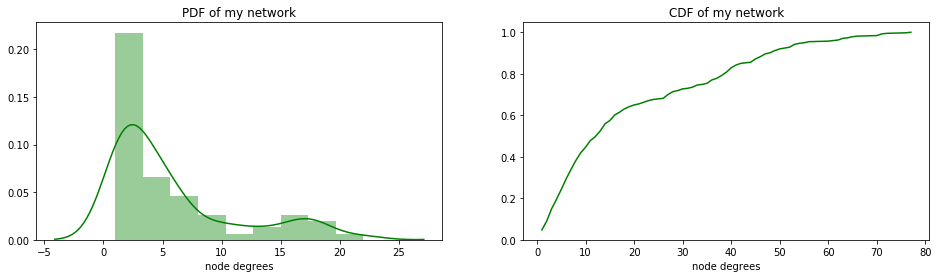

In [28]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.title("PDF of my network")
sns.distplot(degrees_dist, color = 'g')
plt.xlabel('node degrees')

plt.subplot(1,2,2)
plt.title("CDF of my network")
plt.plot(cdf, color = 'g')
plt.xlabel('node degrees')

plt.show()

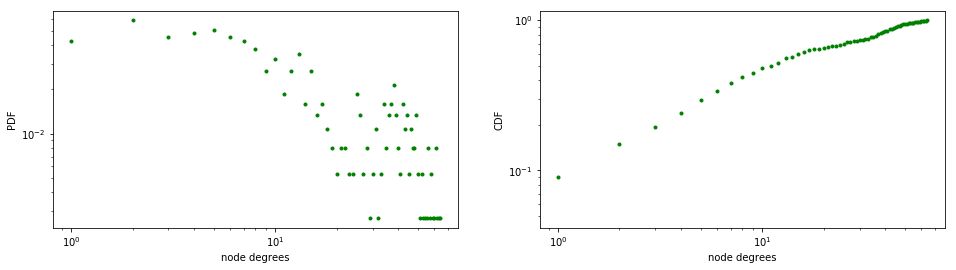

In [29]:
# in log log scale
plt.figure(figsize=(16,4))   
plt.subplot(1,2,1)
plt.loglog(np.arange(0, len(pdf)), pdf, 'g.')
plt.xlabel('node degrees')
plt.ylabel('PDF')
        
plt.subplot(1,2,2)
plt.loglog(np.arange(0, len(cdf)), cdf, 'g.')
plt.xlabel('node degrees')
plt.ylabel('CDF')
plt.show()

In [30]:
print 'The network Diameter:', nx.diameter(G)
print 'The network Average clustering coefficient:', nx.average_clustering(G)
print 'Average shortest path length', nx.average_shortest_path_length(G)

The network Diameter: 8
The network Average clustering coefficient: 0.510948778959
Average shortest path length 3.10190534903


It is clear from PDF, that there are 2 main kinds of my friends - those who have 15-20 mutual friends on average, and those with 0-5 mutual friends. The diameter of the network is 8. So in my network the maximum distanse between people is 8 handshakes.

Clustering coefficient - $c_u = \frac{2 T(u)}{deg(u)(deg(u)-1)},$
where $T(u)$ is the number of triangles through node $u$ and $deg(u)$ is the degree of $u.$

Average clustering coefficient - $C = \frac{1}{n}\sum_{v \in G} c_v,$
where $n$ is the number of nodes in $G$

Average clustering coefficient is average measure of the degree to which nodes in a graph tend to cluster together. In our case, Average clustering coefficient is of mean value - not so high, not so low

In [31]:
print 'Min value of node degree:', np.min(degrees)
print 'Median value of node degree:', np.median(degrees)
print 'Mean value of node degree:', round(np.mean(degrees),2)
print 'Max value of node degree:', np.max(degrees)

Min value of node degree: 1
Median value of node degree: 13.0
Mean value of node degree: 20.08
Max value of node degree: 77


Values of node degrees' min, mean, max could be not so objective as the distribution has 2 peacks.

# 2 Structural Analysis

In [32]:
## find degree, closeness, betweenness and eigenvector centralities and pagerank
degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G)
pagerank = nx.pagerank(G)

## rank nodes depending on scores and set it to nodes attributes
scores = {'DegreeCentrality': degree_centrality, 'ClosenessCentrality': closeness_centrality,
          'BetweennessCentrality': betweenness_centrality, 'EigenvectorCentrality': eigenvector_centrality,
         'PageRank': pagerank}

for i, j in scores.items():
    score_ranking_dict = {key: rank for rank, key in enumerate(sorted(j, key = j.get, reverse=True), 1)}
    nx.set_node_attributes(G, i, j)
    nx.set_node_attributes(G, i+'Rank', score_ranking_dict)
    
## make function for plotting and computing correlation between two different centrality measures
def corr_analysis(first_score, second_score):
    first_score_ranking = list(nx.get_node_attributes(G, first_score+'Rank').values())
    second_score_ranking = list(nx.get_node_attributes(G, second_score+'Rank').values())
    
    plt.plot(first_score_ranking, second_score_ranking, 'g.')
   # plt.title('Between {} and {} rankings -\
    plt.title(
    'Pearson corr coeff: {} \
    \nSpearman rank corr coef: {}\
    \nKendall rank corr coef: {}'.format( \
        str(round(scipy.stats.stats.pearsonr(first_score_ranking, second_score_ranking)[0],2)),
        str(round(scipy.stats.stats.spearmanr(first_score_ranking, second_score_ranking)[0],2)),
        str(round(scipy.stats.stats.kendalltau(first_score_ranking, second_score_ranking)[0],2))))
    plt.xlabel(first_score)
    plt.ylabel(second_score)

### Degree centralities

In [33]:
nodes_df = pd.DataFrame(data = G.node).T
number_to_display = 10

In [34]:
c=nodes_df[["DegreeCentrality", "DegreeCentralityRank", "name", "id"]]\
.sort_values("DegreeCentralityRank").head(number_to_display)
c

,DegreeCentrality,DegreeCentralityRank,name,id
211,0.206434,1,Mariam Margaryan,211
18,0.203753,2,Nadya Sukhareva,18
165,0.193029,3,Daria Kuznetsova,165
55,0.190349,4,Oleg Pavlyuk,55
136,0.190349,5,Darya Sidoruk,136
271,0.190349,6,Viktor Kozlov,271
162,0.187668,7,Nina Panova,162
264,0.176944,8,Nikolay Tesla,264
8,0.174263,9,Anna Rezyapova,8
372,0.174263,10,Olya Gritsenko,372


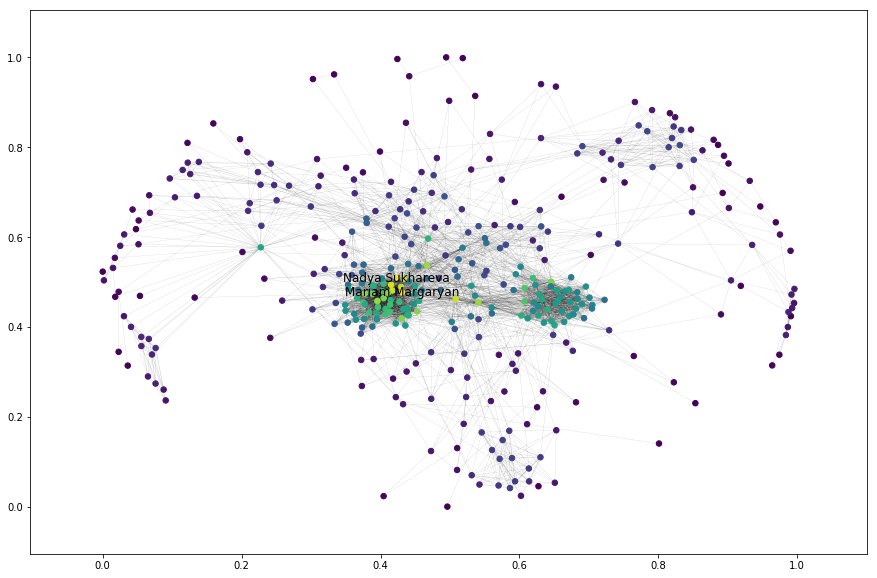

In [46]:
c=c.head(2)

ids_c = c.id.values
names_c = c.name.values
label_dict = {ids_c[i]:names_c[i] for i in range(len(ids_c))}
centrality_list = np.array(nodes_df.DegreeCentrality)

k = nx.degree(G)

plt.figure(figsize=(15,10))
nx.draw_networkx(G, 
                 node_size=30,
                 node_color= centrality_list*1000,                 
                 labels = label_dict,
                 width=0.05)

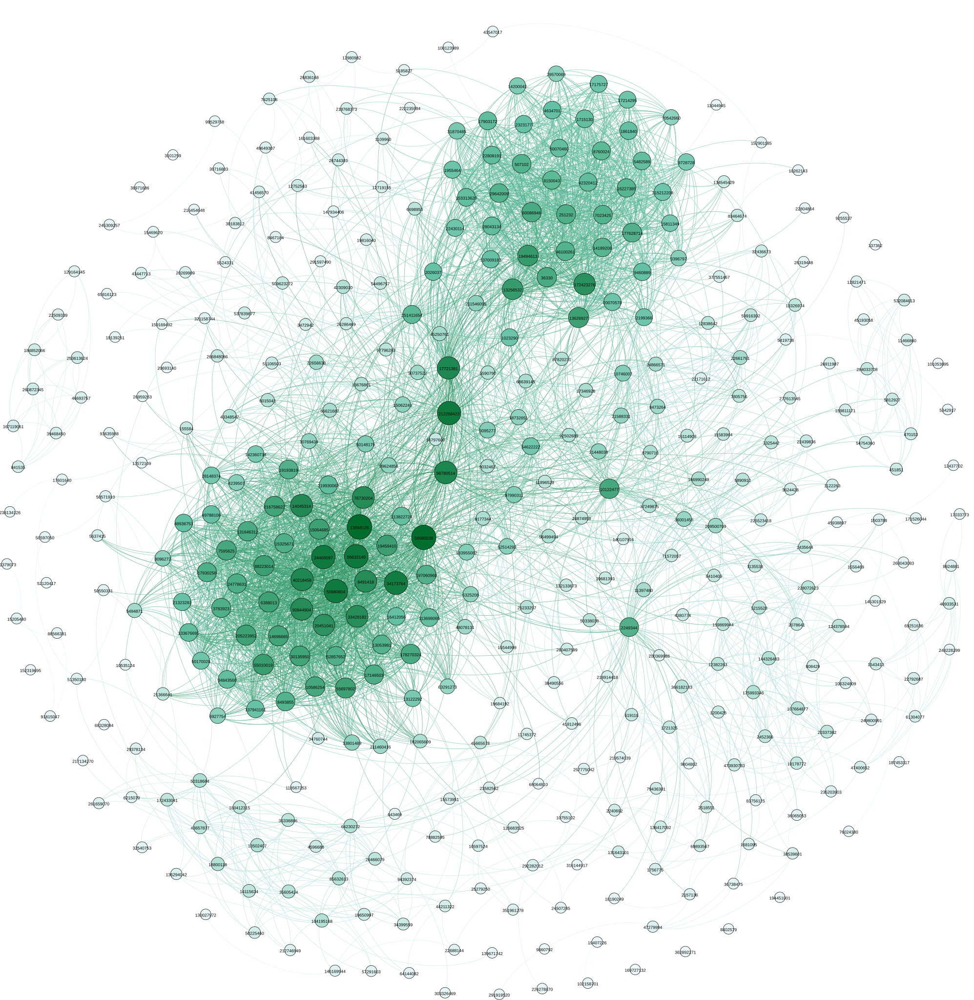

In [35]:
SVG(filename="deg.svg")

Top nodes interpretation:

Top nodes are: Mariam Margarian and Nadya Sukhareva – my groupmates from Bachelor, really sociable people

### Closeness centralities

Closeness Centrality is calculated as the average distance from a given starting node to all other nodes in the network

In [36]:
c=nodes_df[["ClosenessCentrality", "ClosenessCentralityRank", "name", "id"]]\
.sort_values("ClosenessCentralityRank").head(number_to_display)
c

,ClosenessCentrality,ClosenessCentralityRank,name,id
271,0.459926,1,Viktor Kozlov,271
373,0.447779,2,Maria Dittes,373
18,0.44352,3,Nadya Sukhareva,18
211,0.44352,4,Mariam Margaryan,211
264,0.436257,5,Nikolay Tesla,264
55,0.430716,6,Oleg Pavlyuk,55
162,0.430716,7,Nina Panova,162
136,0.429724,8,Darya Sidoruk,136
238,0.429724,9,Garri Rutberg,238
8,0.429229,10,Anna Rezyapova,8


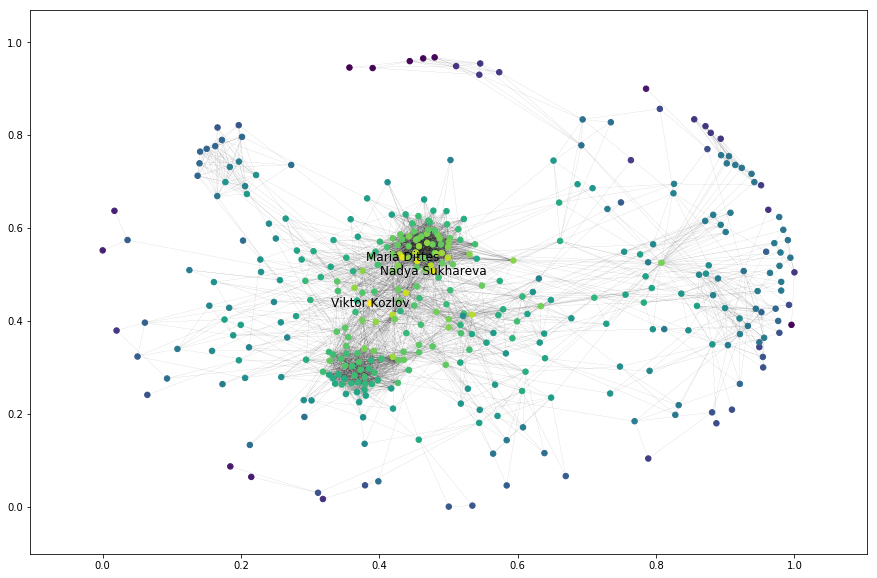

In [86]:
c=c.head(3)

ids_c = c.id.values
names_c = c.name.values
label_dict = {ids_c[i]:names_c[i] for i in range(len(ids_c))}
centrality_list = np.array(nodes_df.ClosenessCentrality)

k = nx.degree(G)

plt.figure(figsize=(15,10))
nx.draw_networkx(G, 
                 node_size=30,
                 node_color= centrality_list*1000,                 
                 labels = label_dict,
                 width=0.05)

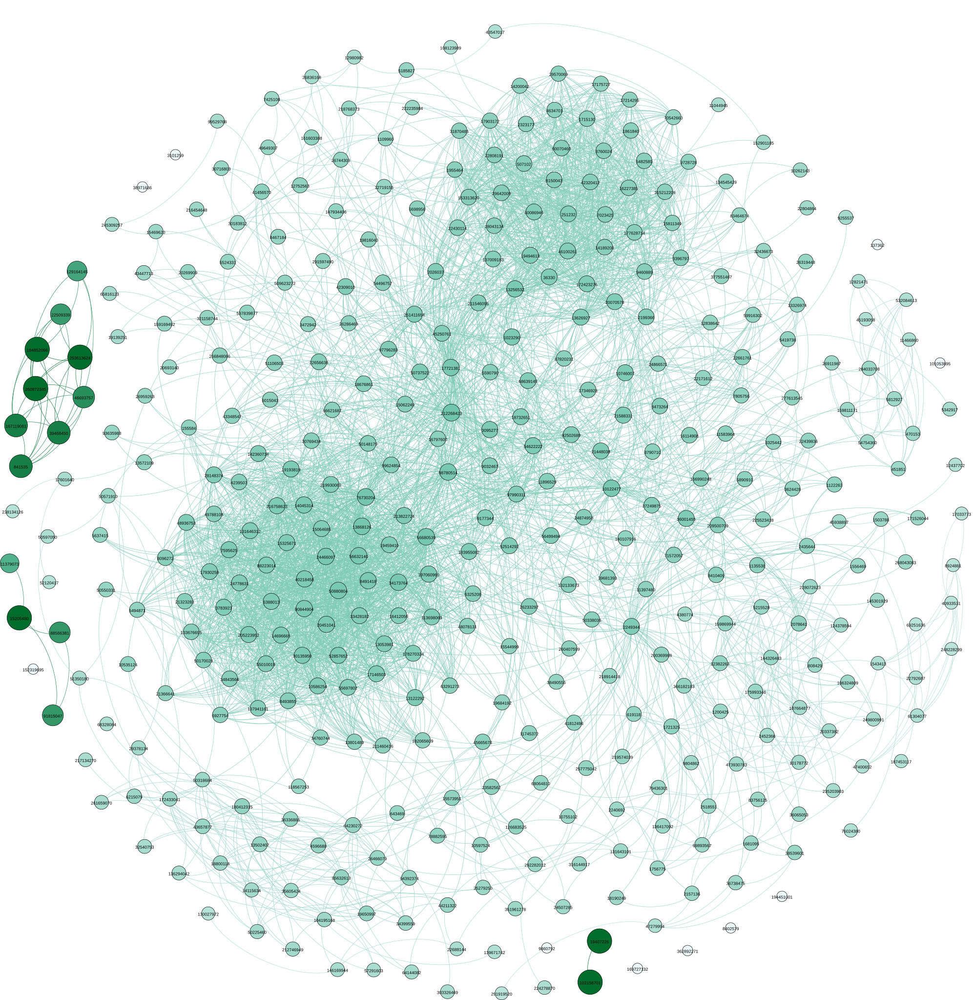

In [37]:
SVG(filename="close.svg")

Top nodes interpretation:

Top nodes are:
Viktor Kozlov (financial expert who shares lots of courses and career opportunities, therefore has lots of people in friends), Nadya Sukhareva and Maria Dittes – my groupmates from Bachelor, really sociable people

### Betweenness centralities

Betweenness Centrality measures how often a node appears on shortest paths between nodes in the network

In [38]:
c=nodes_df[["BetweennessCentrality", "BetweennessCentralityRank", "name", "id"]]\
.sort_values("BetweennessCentralityRank").head(number_to_display)
c

,BetweennessCentrality,BetweennessCentralityRank,name,id
121,0.175587,1,Anatoly Burtsev,121
271,0.106836,2,Viktor Kozlov,271
373,0.0612637,3,Maria Dittes,373
273,0.0559108,4,Yulia Ershova,273
151,0.0538501,5,Alexandra Voronkova,151
238,0.0497915,6,Garri Rutberg,238
264,0.0449215,7,Nikolay Tesla,264
8,0.0399048,8,Anna Rezyapova,8
176,0.0332819,9,Veronika Taxir,176
101,0.0326058,10,Taisia Kulikova,101


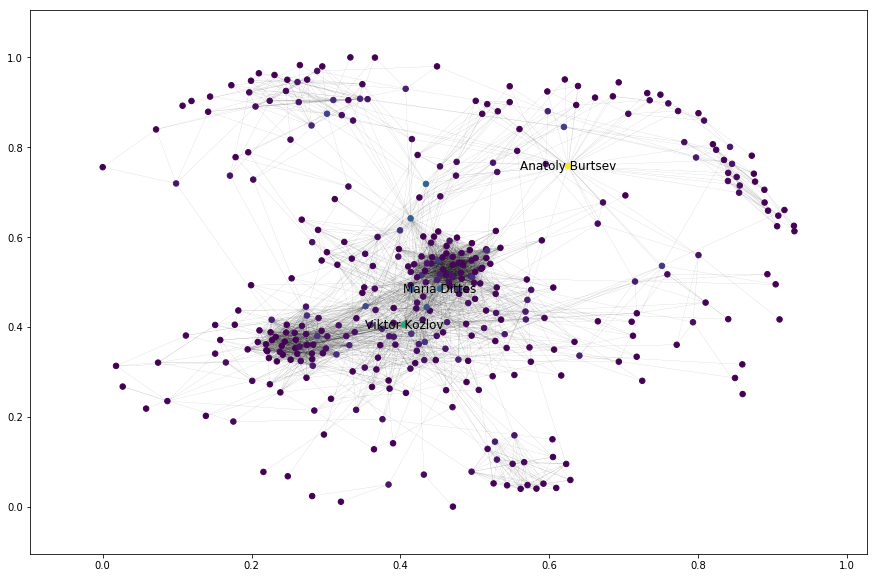

In [88]:
c=c.head(3)

ids_c = c.id.values
names_c = c.name.values
label_dict = {ids_c[i]:names_c[i] for i in range(len(ids_c))}
centrality_list = np.array(nodes_df.BetweennessCentrality)

k = nx.degree(G)

plt.figure(figsize=(15,10))
nx.draw_networkx(G, 
                 node_size=30,
                 node_color= centrality_list*1000,                 
                 labels = label_dict,
                 width=0.05)

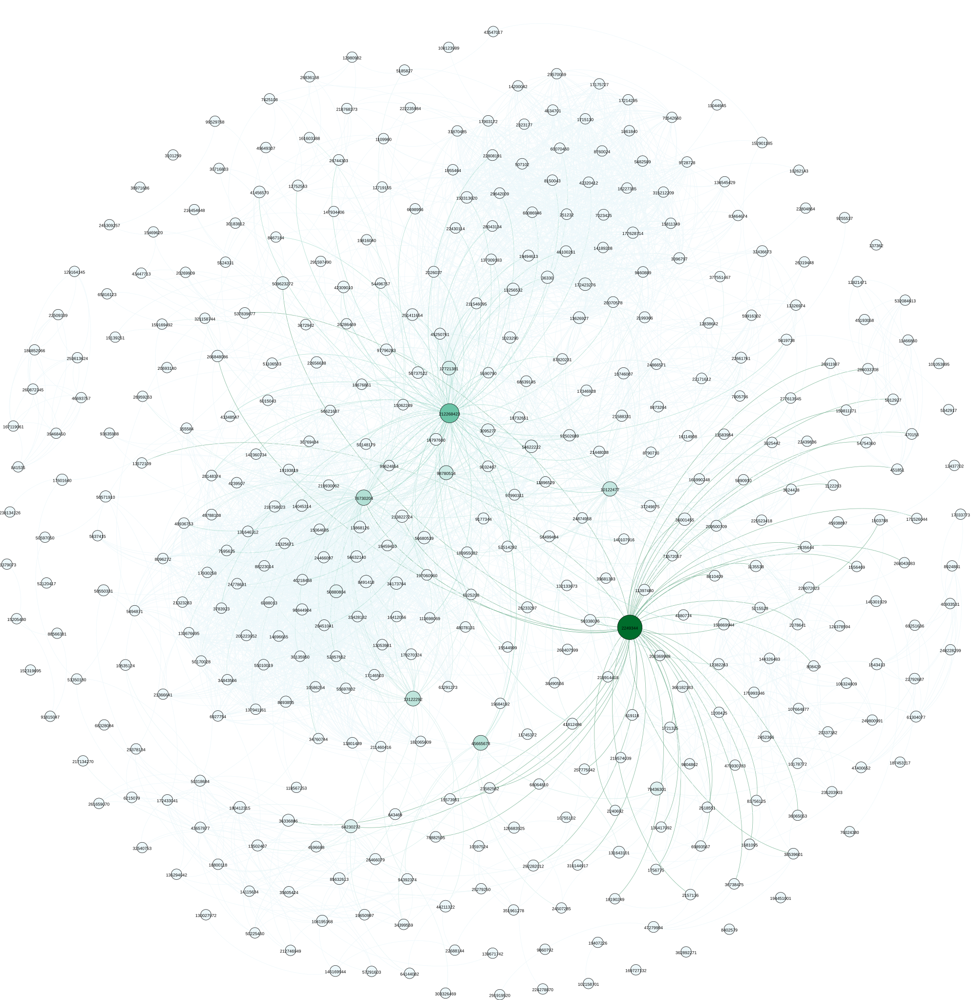

In [39]:
SVG(filename="bet.svg")

There are a few nodes (light colors) that connect main communities. More often they are people how appear in several different communities and are “connections” between these communities

Betweenness Centrality measures how often a node appears on shortest paths between nodes in the network

Top nodes are like connections:

Anatoly Burtsev is my boyfriend, ”the connection to Yaroslavl and MSU friends”
Viktor Kozlov - financial expert, ”the connection to finance network”
Maria Dittes – is my university friend, “the connection to my Bachelor degree friends”
Yulia Ershova – “the connection to my home town school friends”

### Page-Rank. Comparison with centralities

In [40]:
c=nodes_df[["PageRank", "PageRankRank", "name", "id"]]\
.sort_values("PageRankRank").head(number_to_display)
c

,PageRank,PageRankRank,name,id
121,0.0123477,1,Anatoly Burtsev,121
271,0.00812842,2,Viktor Kozlov,271
264,0.00746788,3,Nikolay Tesla,264
18,0.00691662,4,Nadya Sukhareva,18
238,0.00682567,5,Garri Rutberg,238
211,0.00668513,6,Mariam Margaryan,211
162,0.00637849,7,Nina Panova,162
55,0.00628429,8,Oleg Pavlyuk,55
22,0.00627101,9,Daria Petrova,22
165,0.00626042,10,Daria Kuznetsova,165


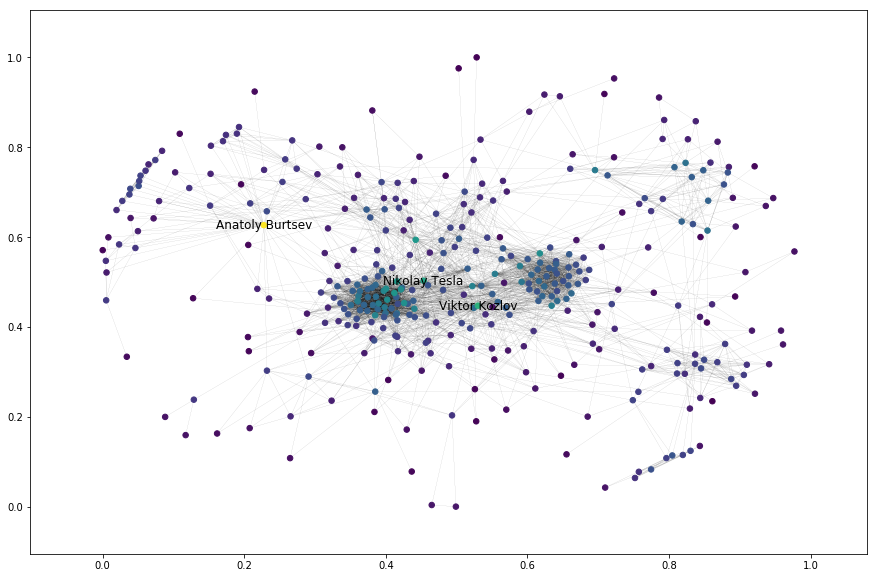

In [53]:
c=c.head(3)

ids_c = c.id.values
names_c = c.name.values
label_dict = {ids_c[i]:names_c[i] for i in range(len(ids_c))}
centrality_list = np.array(nodes_df.PageRank)

k = nx.degree(G)

plt.figure(figsize=(15,10))
nx.draw_networkx(G, 
                 node_size=30,
                 node_color= centrality_list*1000,                 
                 labels = label_dict,
                 width=0.05)

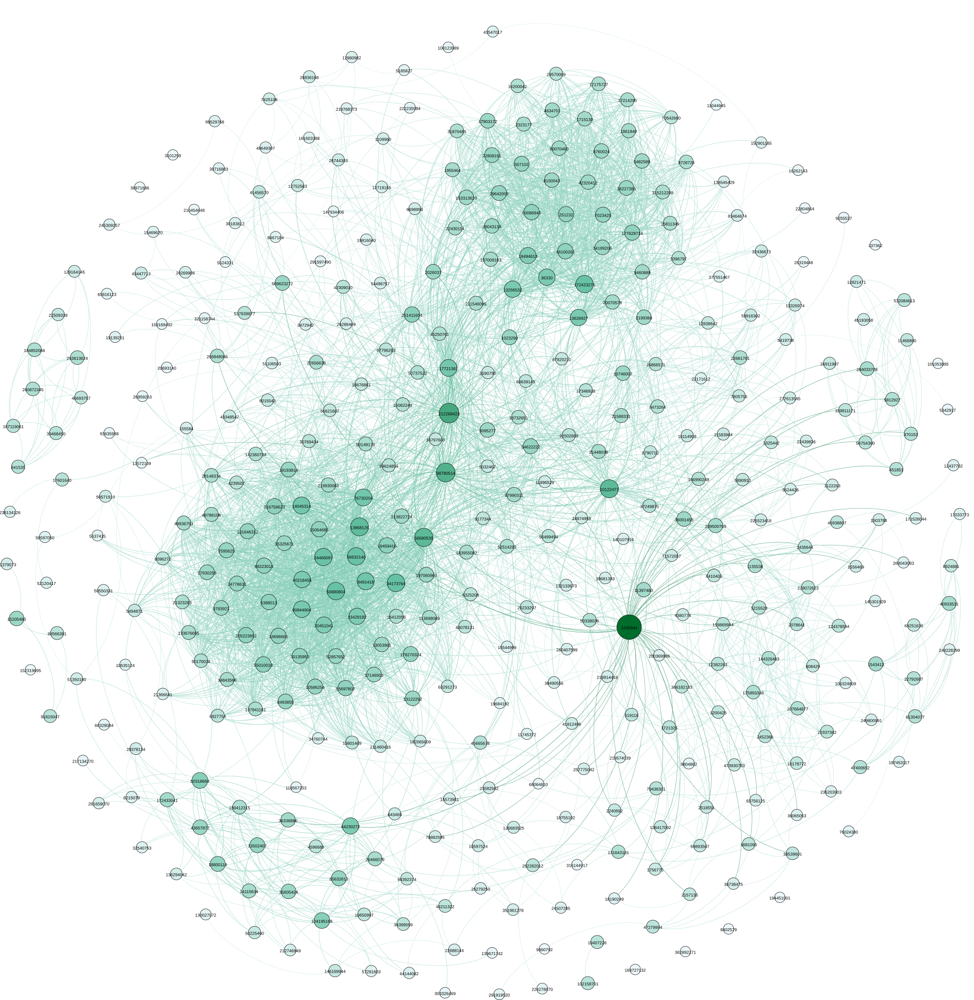

In [41]:
SVG(filename="pr.svg")

PageRank shows those nodes where you finally will be if randomly choose another connected nodes of current nodes 

In my graph all links lead to:

Anatoly Burtsev as the main person in my network
Viktor Kozlov as the person who share a significant amount of useful information
Nikolay Tesla as the main connection of university friends and sport activities


### Comparison with centralities

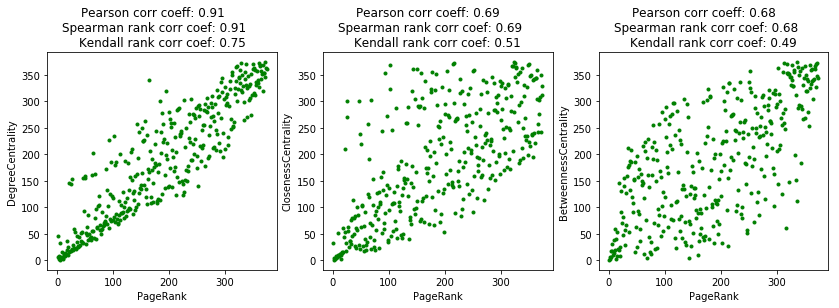

In [42]:
plt.figure(figsize=(14,4))

plt.subplot(1,3,1)
corr_analysis('PageRank', 'DegreeCentrality')
plt.subplot(1,3,2)
corr_analysis('PageRank', 'ClosenessCentrality')
plt.subplot(1,3,3)
corr_analysis('PageRank', 'BetweennessCentrality')

### Assortative Mixing according to node attributes

In [45]:
node_appributes = ['gender', 'city', 'university', 'relation', 'friends']
personal_features_list = ["political", "smoking", "alcohol", "people_main", "life_main"]

all_node_attributes = list(np.append(node_appributes, personal_features_list))

In [46]:
nodes_df = pd.DataFrame(data = G.node).T
nodes_df.head(5)

,BetweennessCentrality,BetweennessCentralityRank,ClosenessCentrality,ClosenessCentralityRank,DegreeCentrality,DegreeCentralityRank,EigenvectorCentrality,EigenvectorCentralityRank,PageRank,PageRankRank,...,gender,id,label,life_main,name,people_main,political,relation,smoking,university
0,0.000532265,253,0.336036,195,0.00536193,341,0.00344908,200,0.000707115,358,...,2,0,13572109,0,Dmitry Menshenin,0,0,0,0,250
1,0.0265825,15,0.410793,21,0.0938338,93,0.0340644,74,0.00422625,48,...,2,1,54622222,5,Roman Faynshmidt,2,8,2,1,128
2,0.00357763,127,0.401075,36,0.142091,23,0.139788,18,0.00459273,31,...,1,2,205223952,6,Darya Rykova,2,0,0,0,128
3,0.0033439,138,0.350894,159,0.0723861,113,0.0762178,55,0.00258957,179,...,2,3,13801489,0,Alexey Chernov,2,4,1,0,2
4,0.00103224,230,0.390985,67,0.126005,40,0.127598,28,0.00397785,70,...,1,4,17930258,0,Katya Anderson,0,0,0,0,128


In [49]:
mod_dict = {}
mod_dict[" "] = ["Modularity", "Number of NaN"]
for attrib in all_node_attributes:
#     if attrib == 'friends':
#         continue
    modularity = nx.attribute_assortativity_coefficient(G, attrib)
    mod_dict[attrib] = [modularity, round(np.sum(nodes_df[attrib]==0),0)]
    #print 'Assortativity coefficient (modularity) for {}: {}'.format(attrib, modularity)

In [50]:
mod = pd.DataFrame(data=mod_dict)
mod.head()

,,alcohol,city,friends,gender,life_main,people_main,political,relation,smoking,university
0,Modularity,0.006065,0.051775,-0.004263,0.062999,-0.014584,-0.013953,-0.015491,-0.011684,0.006915,0.092875
1,Number of NaN,315.000000,0.000000,0.000000,0.000000,289.000000,282.000000,309.000000,291.000000,305.000000,103.000000


r = 1 - Assortative network (“like links with like”): interconnected high degree nodes - core, low degree nodes - periphery

r = -1 - Disassortative network (“"like links with dislike”): high degree nodes connected to low degree nodes, star-like structure

r = 0 the network is non-assortative

Here we have lots of missing data in personal characteristics

All parameters could be considered as non-assortative – with no exact tendency. It could make sense: I’m really active and my network consists of people from summer schools, sport trips, university, courses, some organizations. I add people from different events not looking at their city, number of friends gender and so on. We just need to keep in touch. 

### Node structural equivalence/similarity

Two nodes of a network are structurally equivalent if they share many of the same neighbors.

For node structural equivalence calculation let's use one of algorithm - Euclidean Distance. Euclidean distance is larger for vertices which differ more.

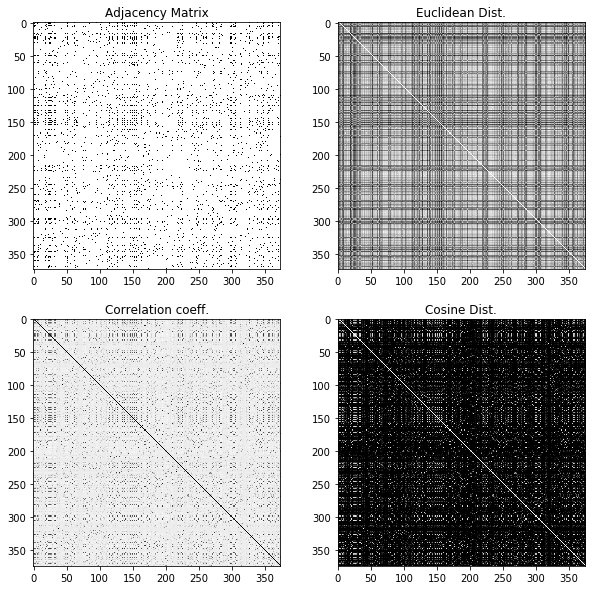

In [55]:
A = nx.to_numpy_matrix(G, dtype=int)
A = np.asarray(A)

def plotDist(A):
    
    f, ax = plt.subplots(2, 2, figsize=(10,10))
    ax[0, 0].imshow(A, cmap = 'Greys', interpolation = 'None')
    ax[0, 0].set_title('Adjacency Matrix')
    
    D = np.corrcoef(A)
    ax[1, 0].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[1, 0].set_title('Correlation coeff.')
    
    dVec = spt.distance.pdist(A, metric = 'euclidean')
    D = spt.distance.squareform(dVec)
    ax[0, 1].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[0, 1].set_title('Euclidean Dist.')
    
    dVec = spt.distance.pdist(A, metric = 'cosine')
    D = spt.distance.squareform(dVec)
    ax[1, 1].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[1, 1].set_title('Cosine Dist.')
    
plotDist(A)   

Run this reordering with nx.utils.reverse_cuthill_mckee_ordering(G) and compare with the results above

In [56]:
dVec = spt.distance.pdist(A, metric = 'euclidean')
D = spt.distance.squareform(dVec)

similar_nodes = np.where(D == 0)
pairs = []
neighbors = []
for i in range(len(similar_nodes[0])):
    if similar_nodes[0][i] != similar_nodes[1][i]:
        if G.neighbors(G.nodes()[similar_nodes[0][i]]) != [] and \
        G.neighbors(G.nodes()[similar_nodes[1][i]]) != []:
            if '{}_{}'.format(G.nodes()[similar_nodes[0][i]], G.nodes()[similar_nodes[1][i]]) not in pairs:
                pairs.append('{}_{}'.format(G.nodes()[similar_nodes[1][i]], G.nodes()[similar_nodes[0][i]]))
                print('Members {} and {} have structural equivalence with neigbors: {}'
                      .format(G.nodes()[similar_nodes[0][i]], 
                             G.nodes()[similar_nodes[1][i]],
                             G.neighbors(G.nodes()[similar_nodes[0][i]])))
                neighbors.append(G.neighbors(G.nodes()[similar_nodes[0][i]])[0])

Members 40 and 339 have structural equivalence with neigbors: [43]
Members 47 and 107 have structural equivalence with neigbors: [32, 240, 98, 342, 247]
Members 171 and 174 have structural equivalence with neigbors: [375]
Members 230 and 245 have structural equivalence with neigbors: [176]


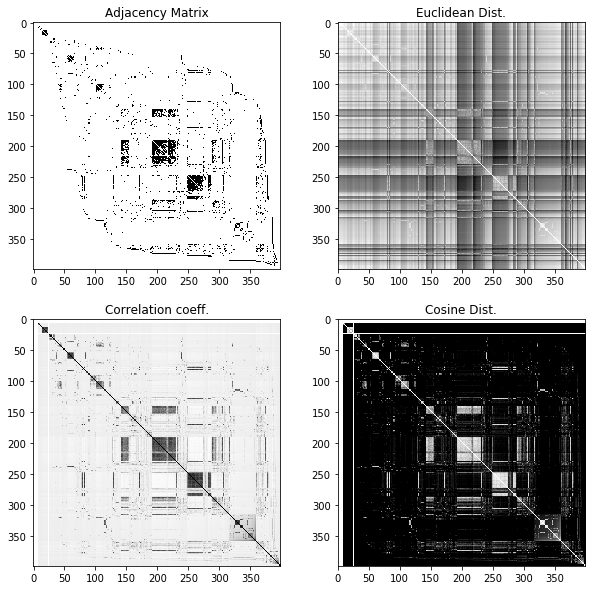

In [57]:
# run procedure
cm = nx.utils.reverse_cuthill_mckee_ordering(G_full)
# get permutation
l = [n for n in cm]

A = nx.to_numpy_matrix(G_full)
A = np.asarray(A)
# apply reordering
A = A[np.ix_(l,l)]

plotDist(A)

Not so many structurally equivalent nodes. All of them are different, so no central elemett could be found. 

This means that the network is diverse and there exists only a few nodes with the same neighbours. Almost every node is unique and has his/her own contacts.

### The closest random graph model similar to your SN

In [64]:
## network attributes
n = nx.number_of_nodes(G)
m = nx.number_of_edges(G)
k = np.mean(list(G.degree().values()))

## Erdos-Renyi graph model
erdos = nx.erdos_renyi_graph(n, m / float(n*(n-1)/2))
## Barabasi-Albert graph model
barbarasi = nx.barabasi_albert_graph(n, int(m/n))
## Watts-Strogatz graph model
watts = nx.watts_strogatz_graph(n, int(k), 0.5)

## Kolmogorov-Smirnov test
KS_erdos = scipy.stats.ks_2samp(list(G.degree().values()), list(erdos.degree().values()))
KS_bar = scipy.stats.ks_2samp(list(G.degree().values()), list(barbarasi.degree().values()))
KS_watts = scipy.stats.ks_2samp(list(G.degree().values()), list(watts.degree().values()))

## Basic graph statistics
data = [[m, nx.average_clustering(G), nx.average_shortest_path_length(G), nx.diameter(G), "-", "-"], 
        [nx.number_of_edges(erdos), nx.average_clustering(erdos), 
         nx.average_shortest_path_length(erdos), nx.diameter(erdos), 
        KS_erdos[0], KS_erdos[1]], 
        [nx.number_of_edges(barbarasi), nx.average_clustering(barbarasi), 
         nx.average_shortest_path_length(barbarasi), nx.diameter(barbarasi), 
        KS_bar[0], KS_bar[1]],
        [nx.number_of_edges(watts), nx.average_clustering(watts), 
         nx.average_shortest_path_length(watts), nx.diameter(watts), 
        KS_watts[0], KS_watts[1]]]

rows = ['My network', 'Erdos-Renyi model', 'Barabasi-Albert model', 'Watts-Strogatz model']
columns = ['# edges', 'Clustering coeff', 'Path length', 'Diameter', "K-S stat", "K-S p_val"]
pd.DataFrame(data, rows, columns)

,# edges,Clustering coeff,Path length,Diameter,K-S stat,K-S p_val
My network,3755,0.510949,3.101905,8,-,-
Erdos-Renyi model,3776,0.052554,2.262849,3,0.470588,4.51303e-37
Barabasi-Albert model,3640,0.123558,2.255566,4,0.419786,1.37946e-29
Watts-Strogatz model,3740,0.128016,2.335035,3,0.540107,1.06494e-48


Kolmogorov-Smirnov is a two-sided test for the null hypothesis that 2 independent samples are drawn from the same continuous distribution.
If the K-S statistic is small or the p-value is high, then we cannot reject the hypothesis that the distributions of the two samples are the same.

According to KS test the closest from these models random graph is Barabasi-Albert model. Still there are huge differences in other parameters

# 3 Community Detection

### Clique search

A clique in a graph $G$ is a complete subgraph of $G$. That is, it is a subset $K$ of the vertices such that every two vertices in $K$ are the two endpoints of an edge in $G$. A maximal clique is a clique to which no more vertices can be added. For each vertex $v$ that is not part of a maximal clique, there must be another vertex $w$ that is in the clique and non-adjacent to $v$, preventing $v$ from being added to the clique. A maximum clique is a clique that includes the largest possible number of vertices.

In [65]:
print "Number of maximal cliques of my friends network is:", nx.graph_number_of_cliques(G)
print "Each of them contains up to {} people".format(nx.graph_clique_number(G))

Number of maximal cliques of my friends network is: 3567
Each of them contains up to 23 people


In [66]:
max_clique = sorted(list(nx.find_cliques(G)), key = len, reverse=True)[0]

23


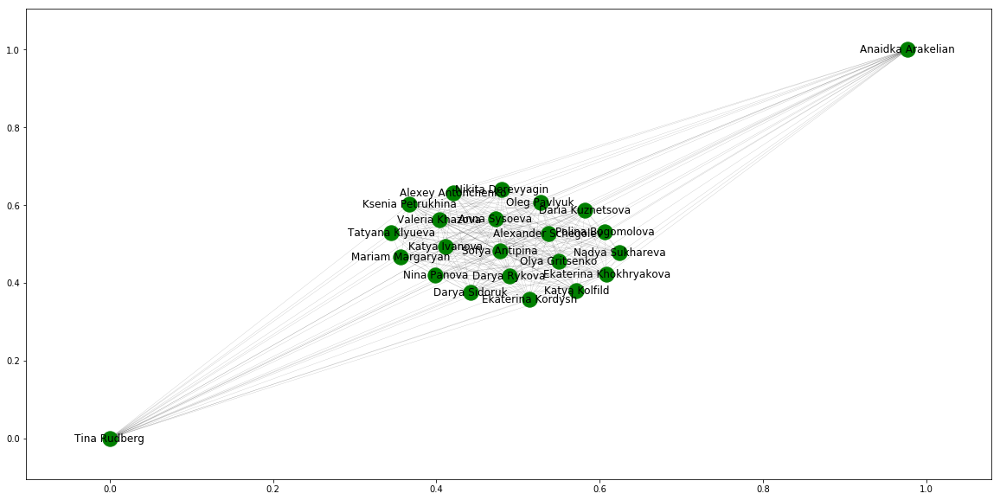

In [67]:
plt.figure(figsize=(20,10))

print(len(max_clique))
maximum_clique_subgraph = G.subgraph(max_clique)
nx.draw_networkx(maximum_clique_subgraph, 
                 node_color = 'g',
                 labels = {cl_key:cl_val["name"] for cl_key, cl_val in maximum_clique_subgraph.node.items()}, 
                 width = 0.08)
plt.show()

Here is one of the maximal cliques with 23 members.
All these people are my Bachelor groupmates or people from that course

### k-core decomposition

The connected components that are left after all vertices of degree less than k have been removed are called the k-cores of the graph and the degeneracy of a graph is the largest value k such that it has a k-core.

In [71]:
core_dict = nx.core_number(G)
nx.set_node_attributes(G, 'Core', core_dict)
nx.write_gml(G, 'core.gml')

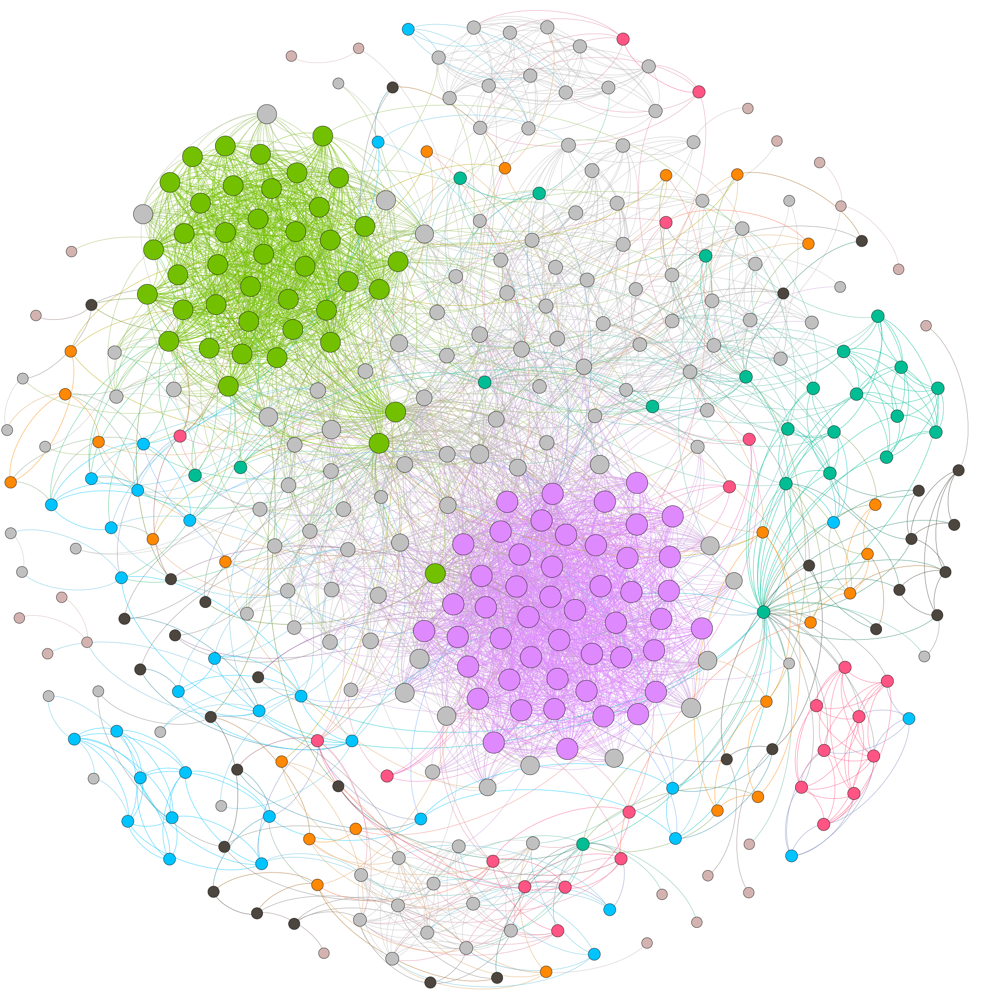

In [72]:
SVG(filename="core.svg")

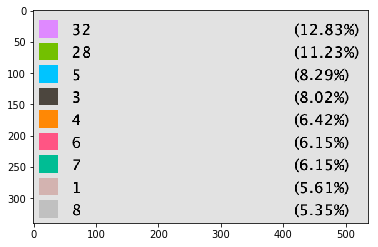

In [75]:
description = mpimg.imread('description.png')
plt.imshow(description)

The k-core decomposition identify subgraphs of increasing centrality (the property of being more densely connected). The study of the obtained subgraphs uncovers the main hierarchical layers of the network so their statistical characteristics could be investigated.

### Best results of various community detection algorithms

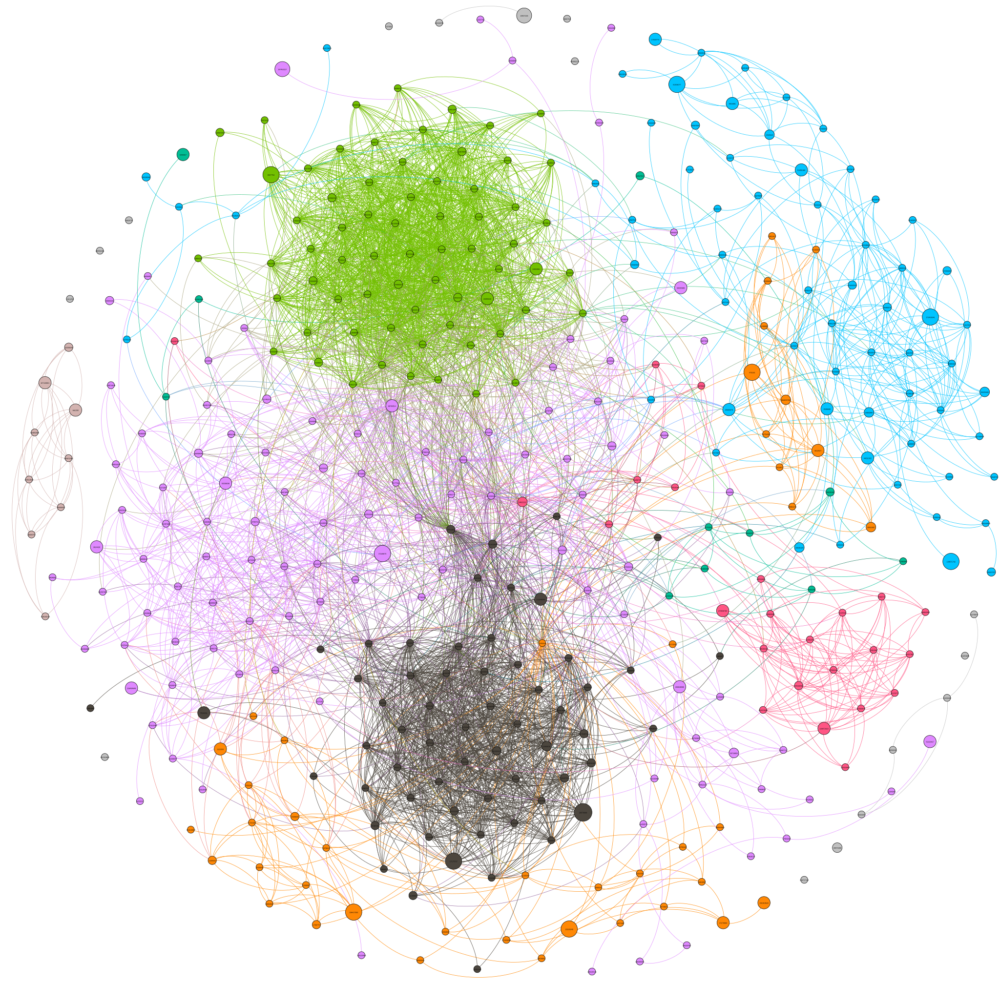

In [68]:
SVG(filename="community.svg")

* Those in green are my groupmates from Bachelor and coursemates
* Those in pink – are my university related friends (also Master degree friends)
* Those in black – are my friends from Changellenge winter school
* Those in light blue on the right are my school/home town friends
* Those in light brown – are people from speaking club
* Those in orange on the bottom – are friends from snowboarding camp 
* Those in orange on the right – are friends from Javabootcamp
* Those in red on the right bottom – are friends from conference

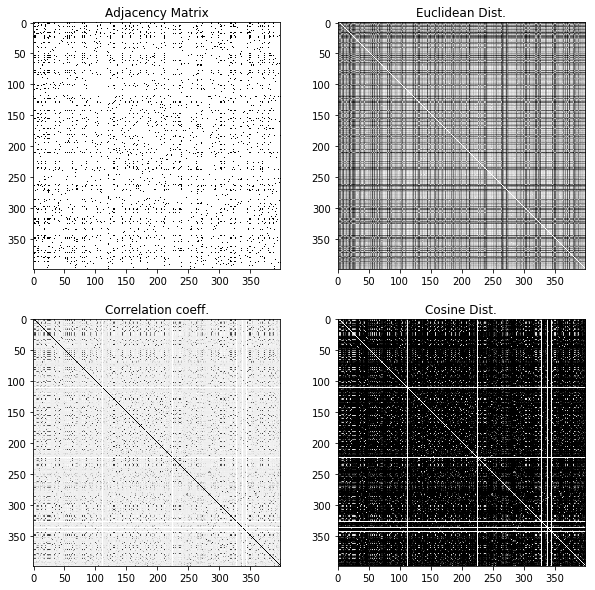

In [69]:
A = nx.to_numpy_matrix(G_full, dtype=int)
A = np.asarray(A)
    
plotDist(A)  

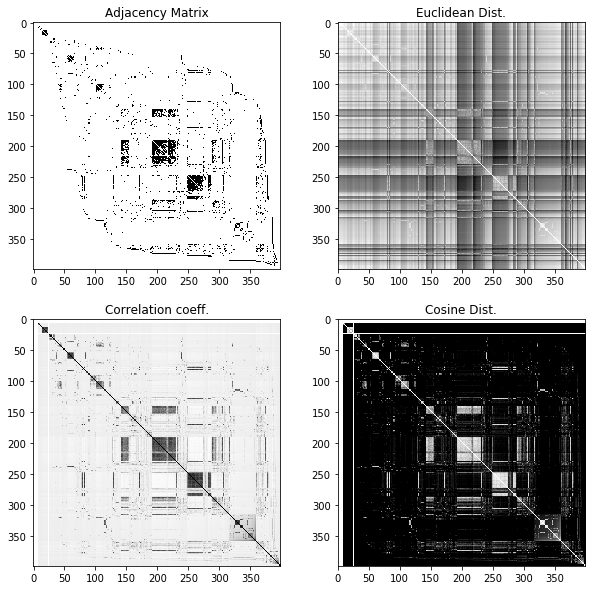

In [70]:
# run procedure
cm = nx.utils.reverse_cuthill_mckee_ordering(G_full)
# get permutation
l = [n for n in cm]

A = nx.to_numpy_matrix(G_full)
A = np.asarray(A)
# apply reordering
A = A[np.ix_(l,l)]

plotDist(A)

After reordering the nodes the following matrices were received.

It is clear, that there are 2 large communities – big squares on the middle of diagonal. Also, there are many small communities – small squares on the diagonal.

As it was mentioned: these 2 main communities are my friends from University and from Changellenge winter school. 
Tiny communities may be my school friends, sport trips friends, some courses friends, speaking club and mafia club friends. 